In [167]:
# Import numpy for numerical computation, torch for deep learning, matplotlib for plotting, and OpenCV for image processing
import numpy as np
import torch
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
import cv2
from ultralytics import YOLO
from PIL import Image
import os

Initialise model

In [ ]:
sam_checkpoint = "sam_vit_h_4b8939.pth" # Path to the checkpoint file
model_type = "vit_h" # Model type

device = "cuda" if torch.cuda.is_available() else "cpu" # Use GPU if available, otherwise use CPU

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint) # Load the model
sam.to(device=device) # Move the model to the device

mask_generator = SamAutomaticMaskGenerator(sam) # Create a mask generator

# Testing

Functions

In [12]:
# Define a function to display the segmentations (annotations)
def show_anns(anns):
    # If there are no annotations, return immediately
    if len(anns) == 0:
        return
    
    # Sort the annotations by area in descending order
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    
    # Set up the plot using Matplotlib
    ax = plt.gca()
    ax.set_autoscale_on(False)

    # Create an image placeholder with the same shape as the segmentation map
    # The fourth channel is for alpha (transparency)
    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0  # Set the alpha channel to 0 (transparent)
    
    # For each annotation in the sorted list
    for ann in sorted_anns:
        # Get the segmentation map
        m = ann['segmentation']
        # Create a color mask with random colors and a fixed alpha value
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        # Apply the color mask to the segments identified in the image
        img[m] = color_mask
    # Display the image with the colored segmentations
    ax.imshow(img)

# define a function to filter the mask based on the area
def filter_mask(mask, h, w):
    # specify the minimum area of the mask
    min_area = 0.03 * h * w
    # create a new dictionary
    new_dict = []

    # filter the masks based on the area
    for i in masks:
        if i['area'] > min_area:
            new_dict.append(i)
    
    return new_dict

Load image

In [3]:
image = cv2.imread('images/dog.jpg') # Read image from file
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Convert from BGR to RGB

Initialise model and mask generator

In [24]:
sam_checkpoint = "sam_vit_h_4b8939.pth" # Path to the checkpoint file
model_type = "vit_h" # Model type

device = "cuda" if torch.cuda.is_available() else "cpu" # Use GPU if available, otherwise use CPU

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint) # Load the model
sam.to(device=device) # Move the model to the device

mask_generator = SamAutomaticMaskGenerator(sam) # Create a mask generator

Generate mask

In [52]:
masks = mask_generator.generate(image) # Generate masks

Show mask overlayed on top of original image

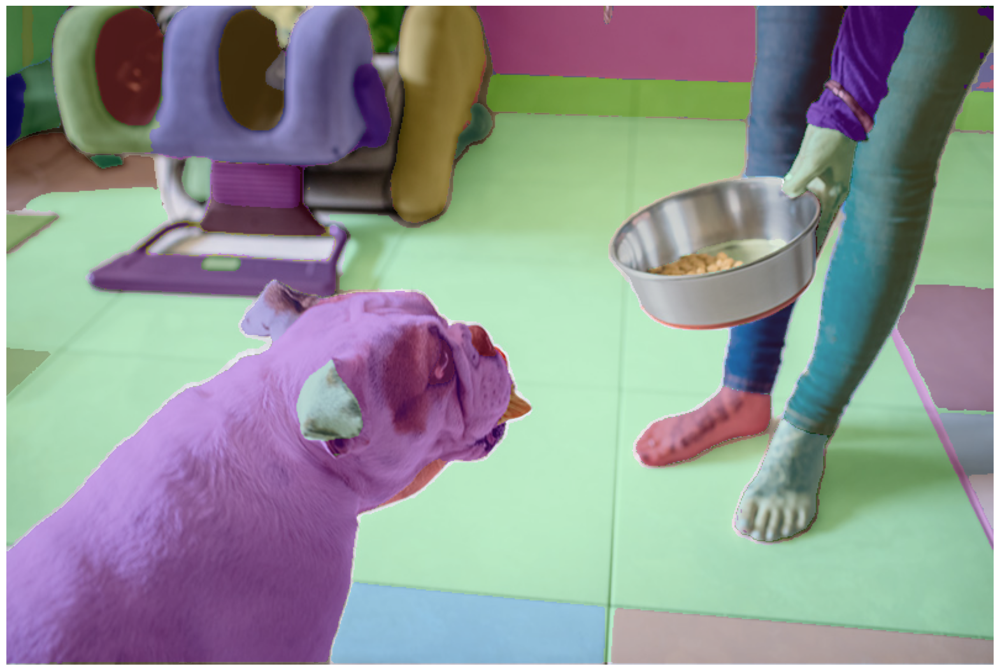

In [53]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show()

Filter mask and displays each individual mask

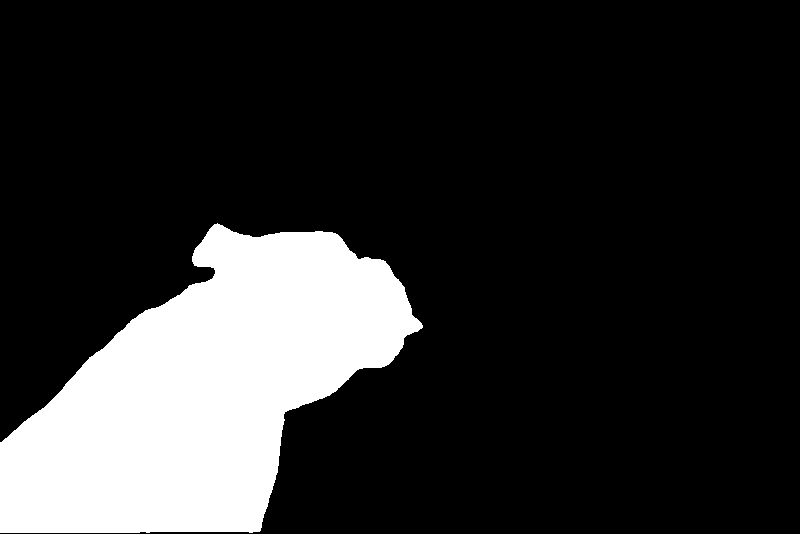

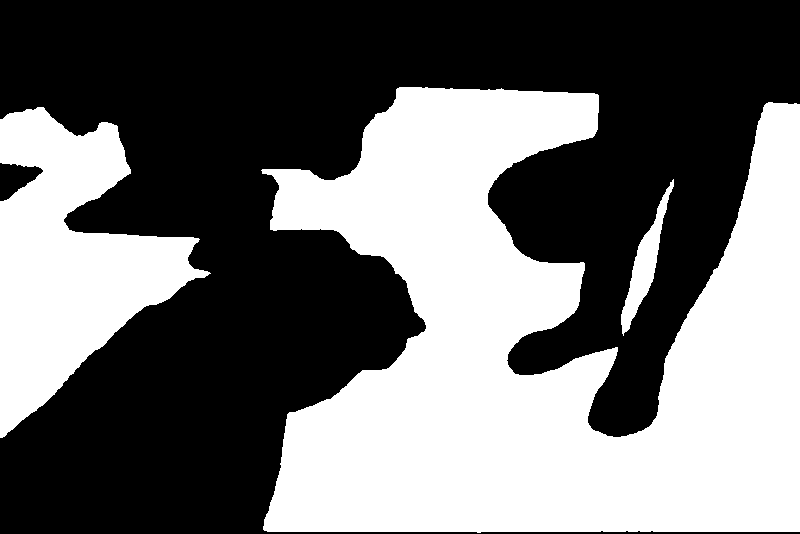

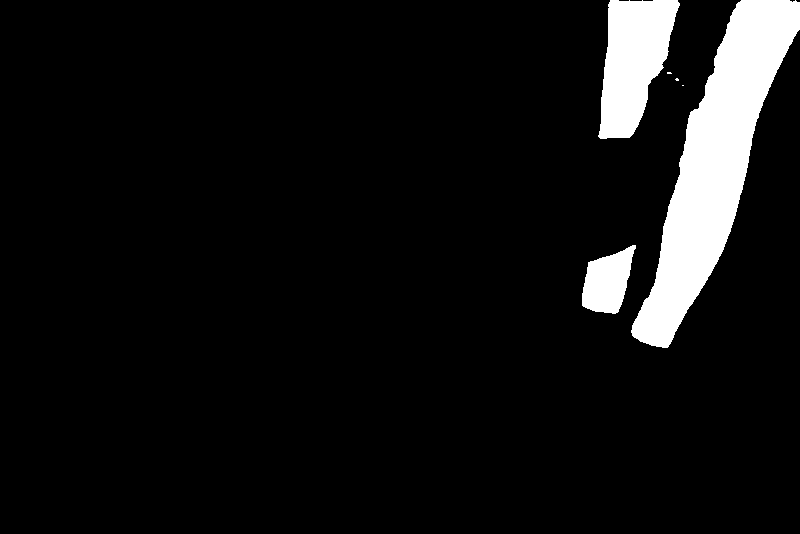

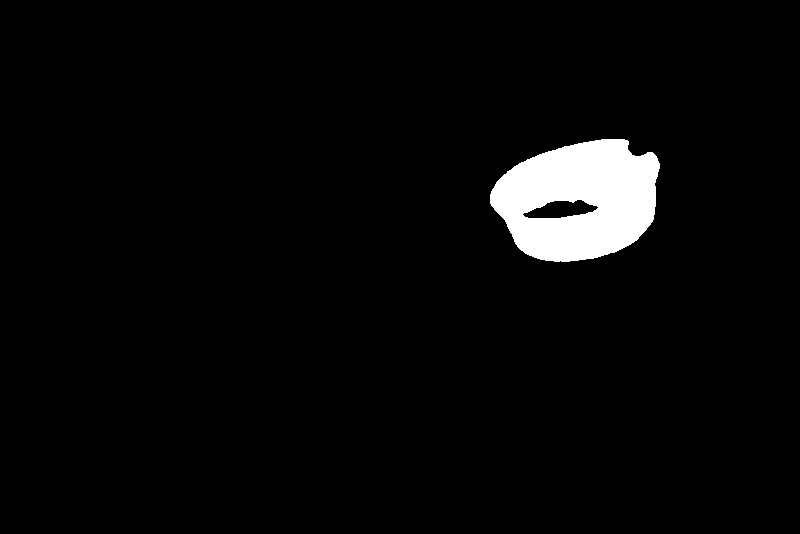

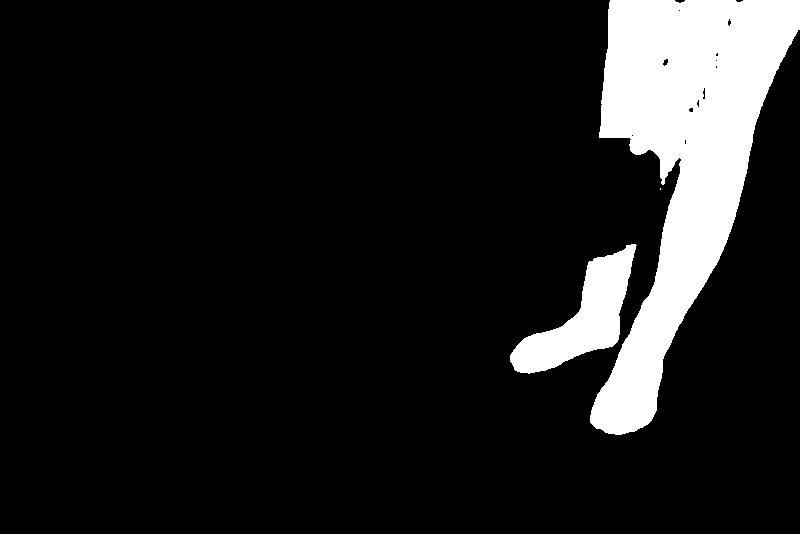

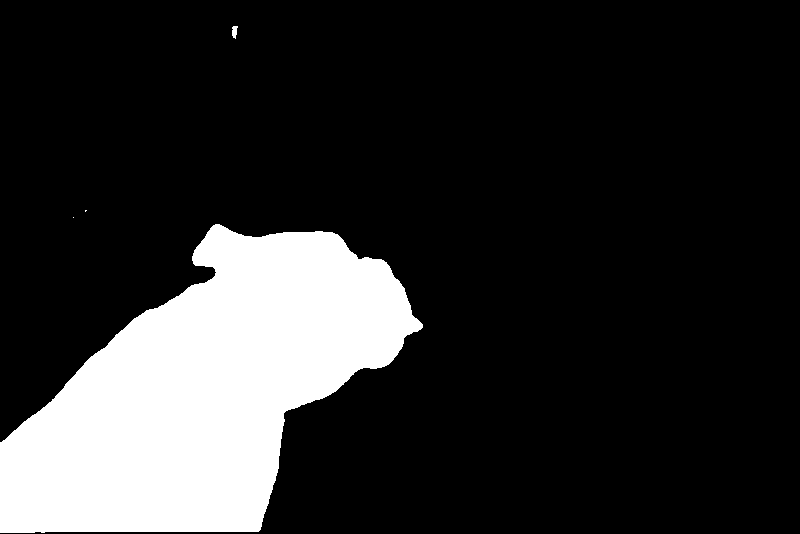

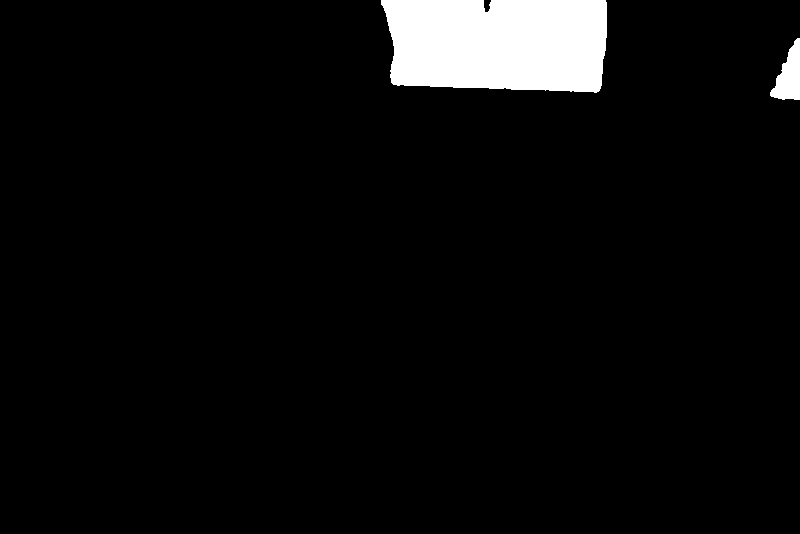

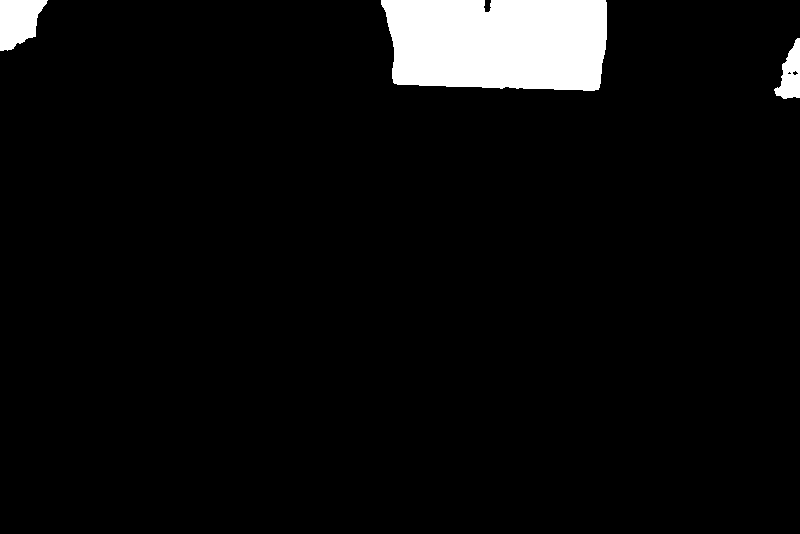

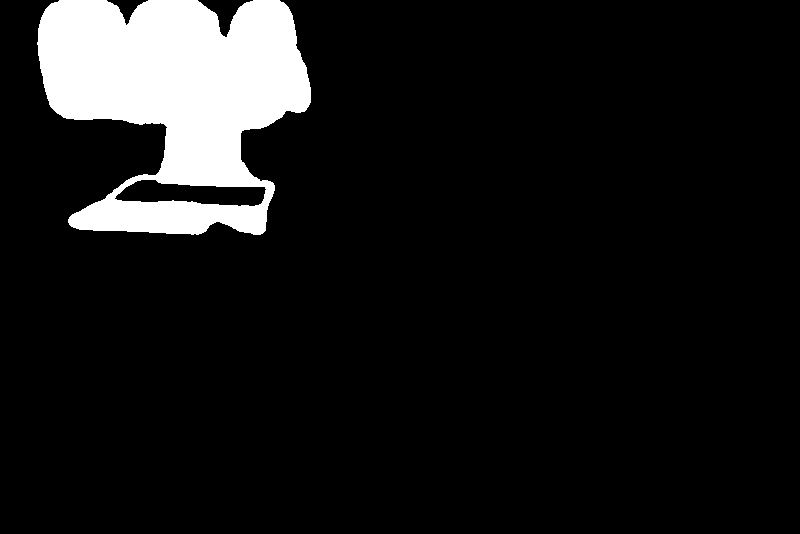

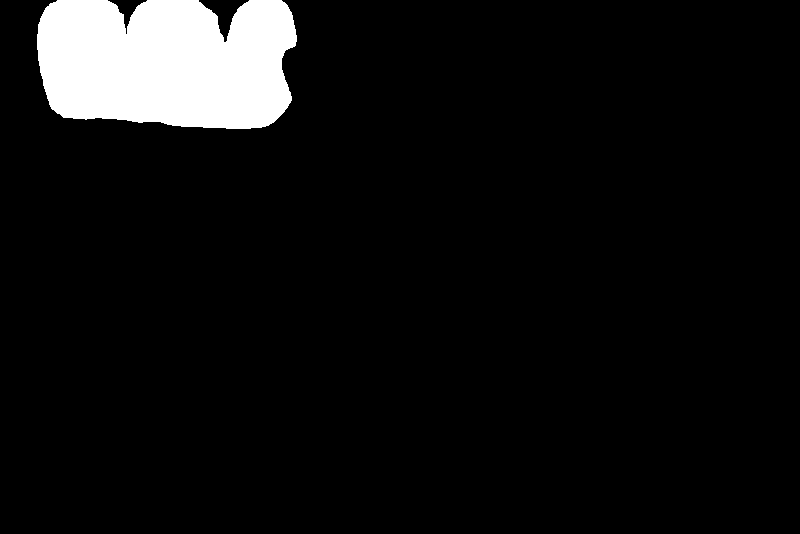

In [54]:
# Get the height and width of the image
h, w = image.shape[:2]

masks = filter_mask(masks, h, w)

for i in range(len(masks)):
    display(Image.fromarray(masks[i]['segmentation']).resize((w, h)))


Combine mask

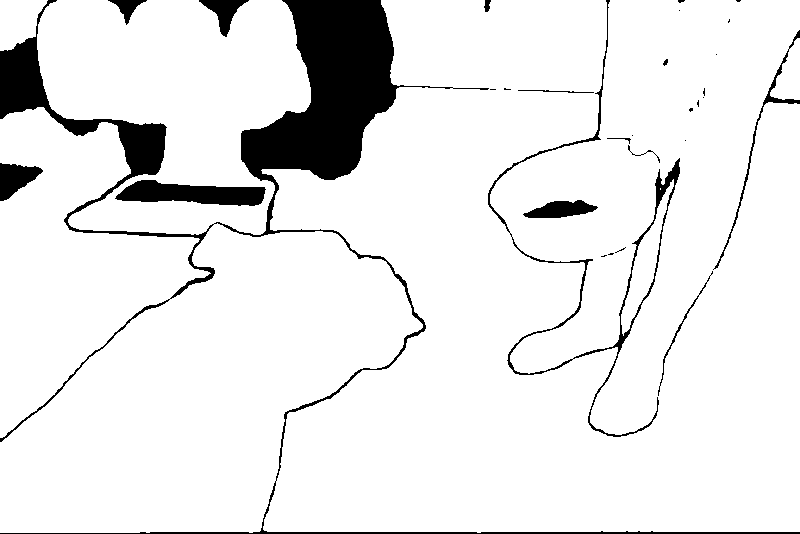

In [55]:
combined_masks = np.zeros_like(masks[0]['segmentation'])

for mask in masks:
    combined_masks += mask['segmentation']

combined_masks_normal = (combined_masks / combined_masks.max() * 255).astype(np.uint8)

display(Image.fromarray(combined_masks_normal).resize((w,h)))

Display combined mask

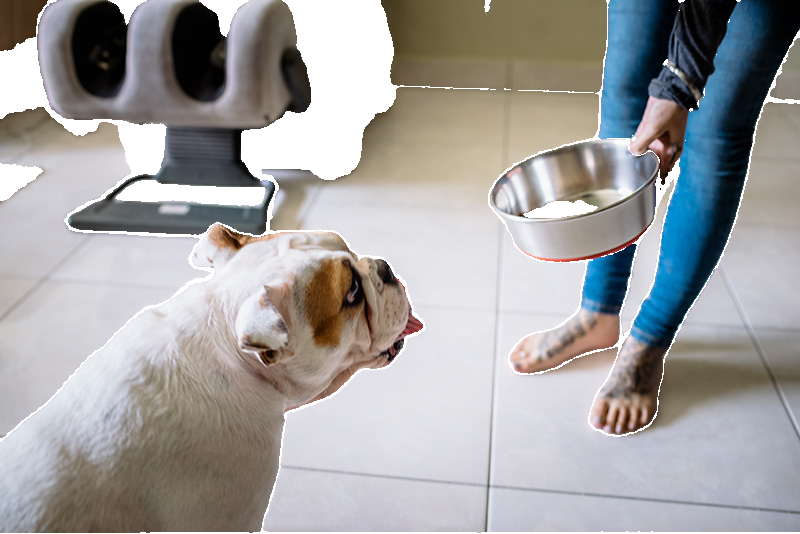

In [56]:
masked_image = image * combined_masks[:,:,np.newaxis] + (1 - combined_masks[:,:,np.newaxis]) * 255
masked_image = np.uint8(masked_image)

masked_image = Image.fromarray(masked_image)

display(masked_image.resize((w, h)))

Display remainder

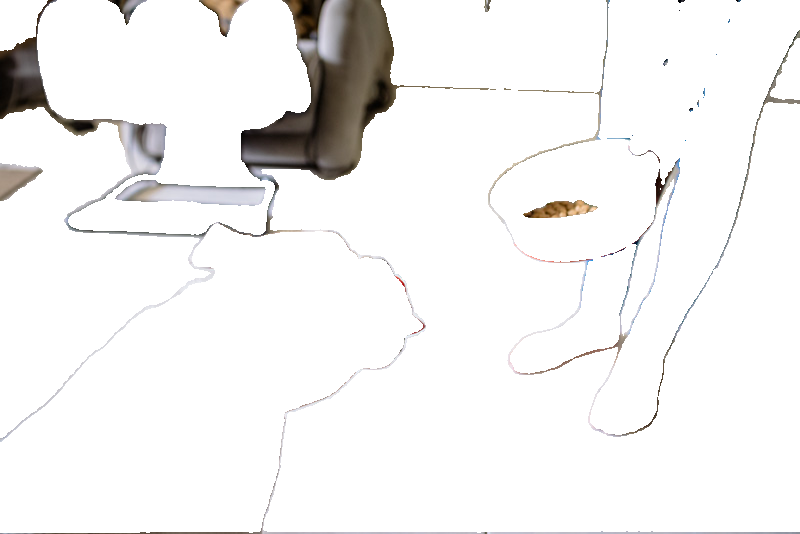

In [57]:
masked_image = image * (1 - combined_masks[:,:,np.newaxis]) + combined_masks[:,:,np.newaxis] * 255
masked_image = np.uint8(masked_image)
masked_image = Image.fromarray(masked_image)
display(masked_image.resize((w,h))) 

---

# Pre-trial

In [67]:
image = cv2.imread('images/dog.jpg') # Read image from file
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Convert from BGR to RGB

In [68]:
masks = mask_generator.generate(image) # Generate masks

In [135]:
labels = {
    0: "Pipe",
    1: "Wall",
    2: "Floor",
    3: "Ceiling",
    4: "Door",
    5: "Door frame",
    6: "Gate",
    7: "Building materials",
    8: "Tools",
    9: "Windows",
    10: "Person",
    11: "Safety rails",
    12: "Electrical cable",
    13: "Lens effect",
    14: "NA"
}

def prompt_user():
    legend = ""
    for key, val in labels.items():
        legend += str(key) + ": " + val +'\n'
    while True:
        try:
            user_input = int(input(legend + "Please enter a number: "))
            if 0 <= user_input <= 14:
                print(f"You selected: {labels[user_input]}")
                break
            else:
                print("The number is not within the range. Please try again.")
        except ValueError:
            print("That's not a valid number. Please try again.")
    return user_input

# extract the coordinates of the segment from SAM into a list of numpy array
def extract_segment(mask):
    binary_mask = np.array(mask) # get the segmentation of the mask and convert it to a numpy array
    binary_mask = (binary_mask * 255).astype(np.uint8) # convert the mask to a binary mask

    contours, hierarchy = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE) # find contours from the binary image
    polygon_coords = [] # stores the coordinates of the vertices of the polygon
    
    for contour in contours:
        epsilon = 0.01 * cv2.arcLength(contour, True) # approximate contour with accuracy proportional to the contour perimeter
        approx = cv2.approxPolyDP(contour, epsilon, True) # approximate contour with the Douglas-Peucker algorithm

        polygon_coords.append(approx) # add the coordinates of the vertices of the polygon to the list
    return polygon_coords

# display the segment on the image
def draw_segment(img, coord):
    cv2.drawContours(img, coord, -1, (0, 255, 0), 3) # draw the contours on the image
    plt.imshow(img, cmap='gray') # show the image
    plt.show()

def numpy_to_list(numpy_arr):
    # Convert each numpy array in the list to a regular list and extract the inner lists
    coord_list = [coord[0].tolist() for array in numpy_arr for coord in array]
    flat_list = []
    for coord in coord_list:
        flat_list.append(coord[0])
        flat_list.append(coord[1])
    return flat_list



In [136]:
segment_coords = extract_segment(masks[0]['segmentation'])
segment_coords


[array([[[404, 287]],
 
        [[332, 232]],
 
        [[214, 224]],
 
        [[192, 256]],
 
        [[213, 277]],
 
        [[132, 319]],
 
        [[  0, 442]],
 
        [[  0, 532]],
 
        [[259, 531]],
 
        [[284, 412]],
 
        [[393, 359]],
 
        [[422, 327]]], dtype=int32)]

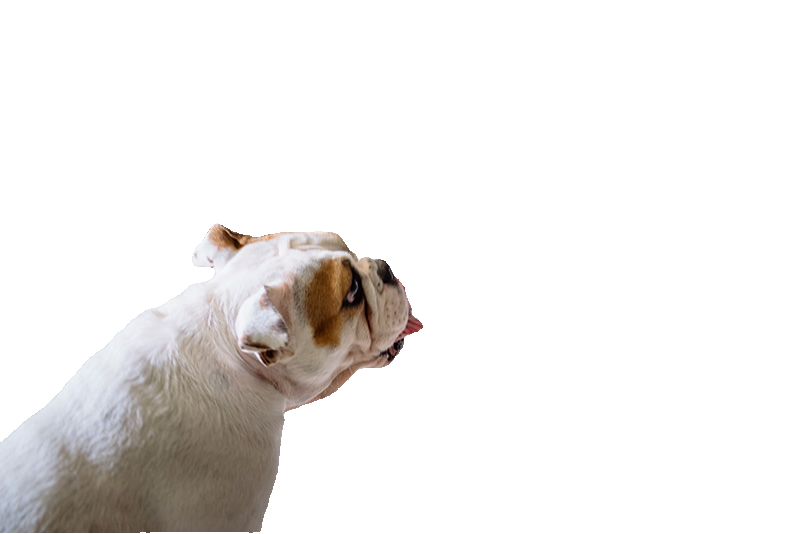

You selected: Wall


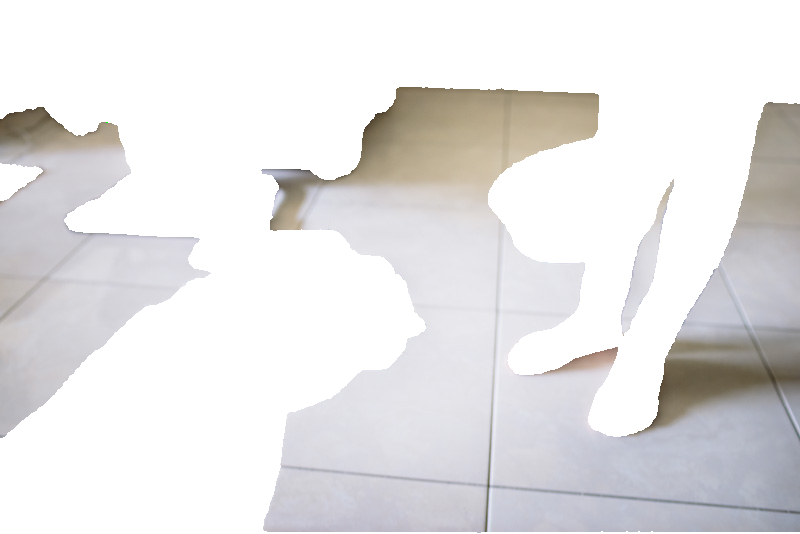

You selected: Floor


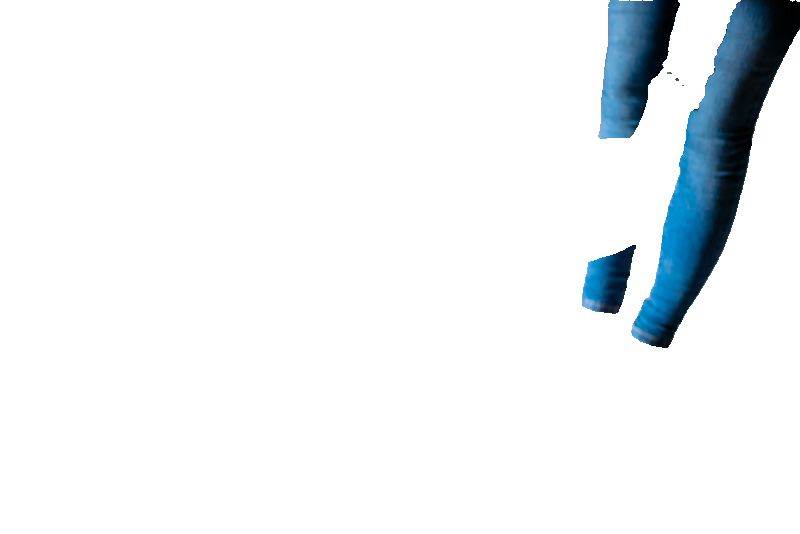

You selected: Ceiling


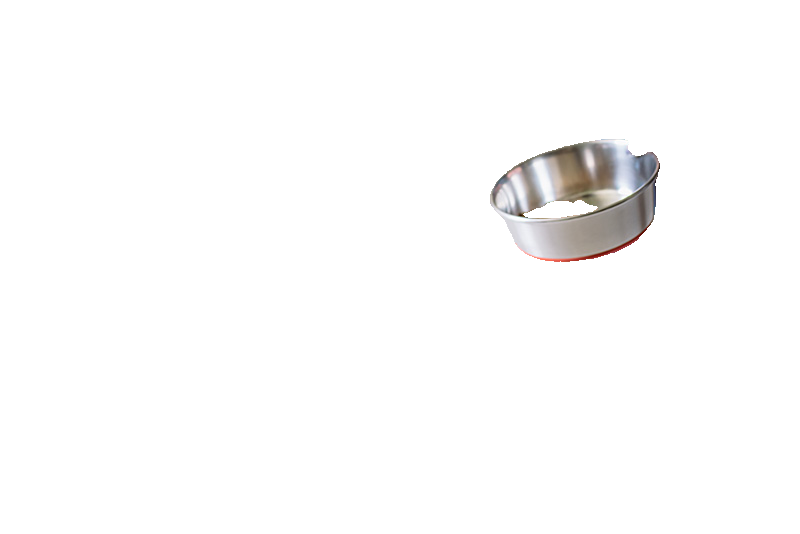

You selected: Door


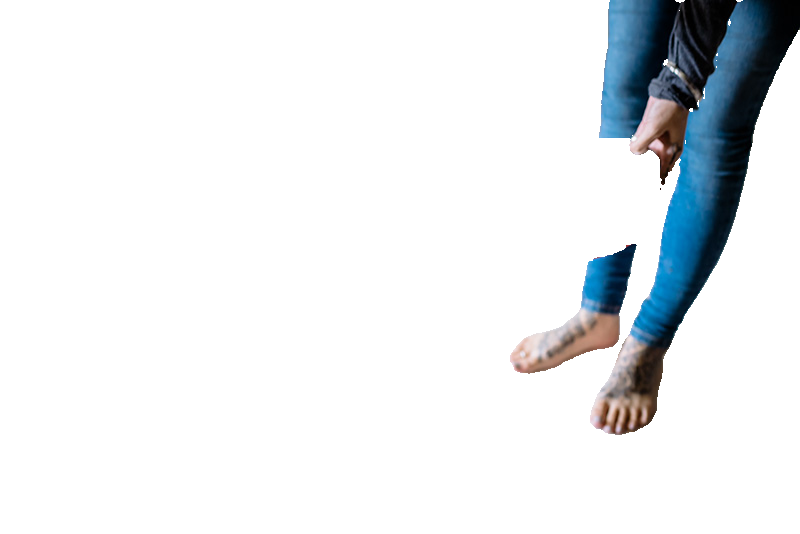

You selected: Door frame


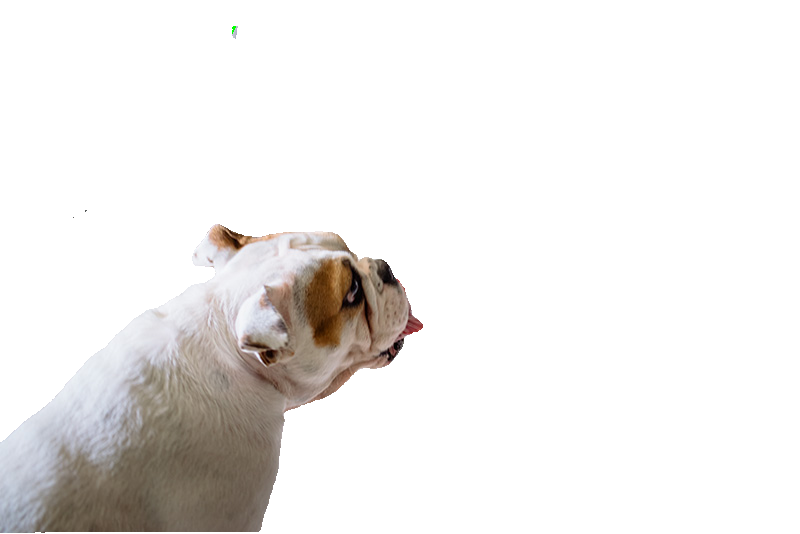

You selected: Gate


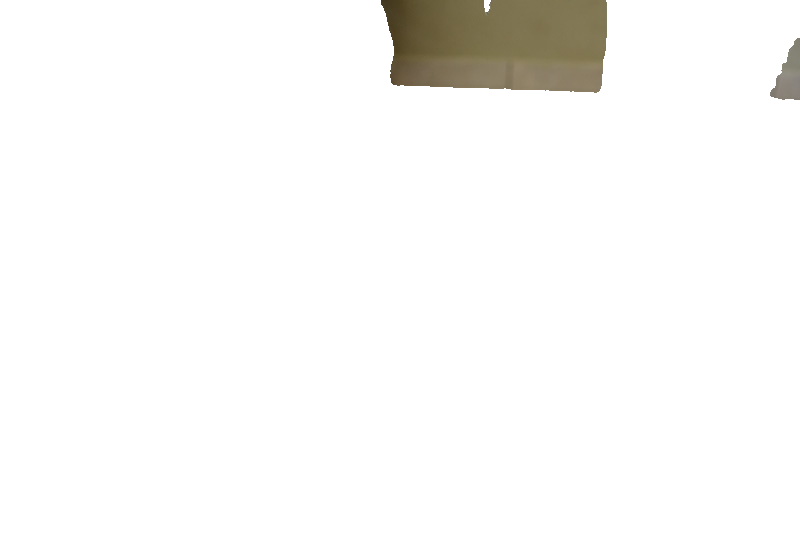

You selected: Building materials


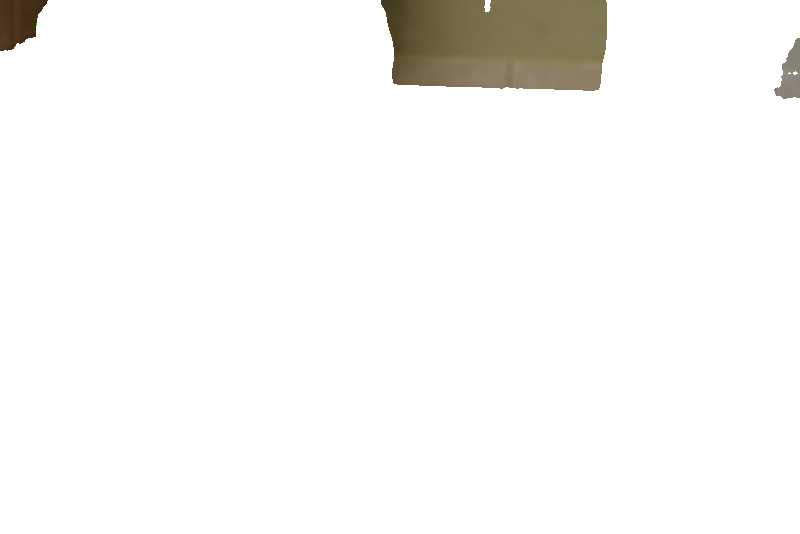

You selected: Tools


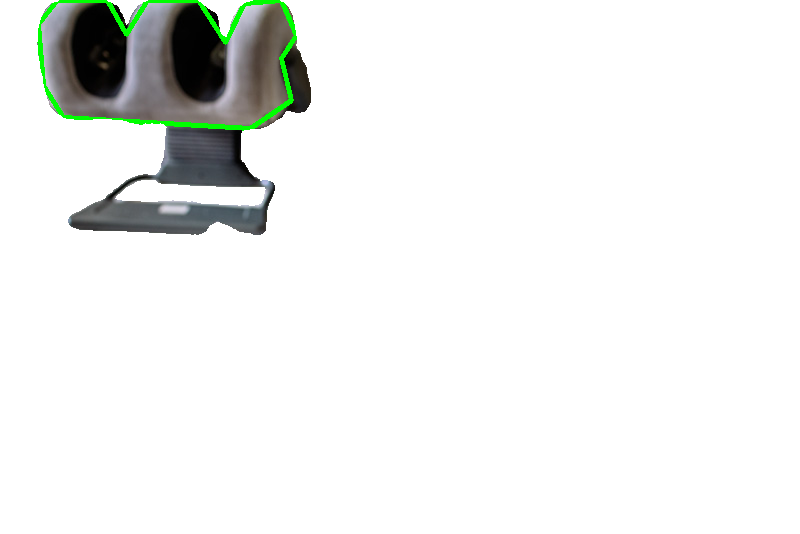

You selected: Windows


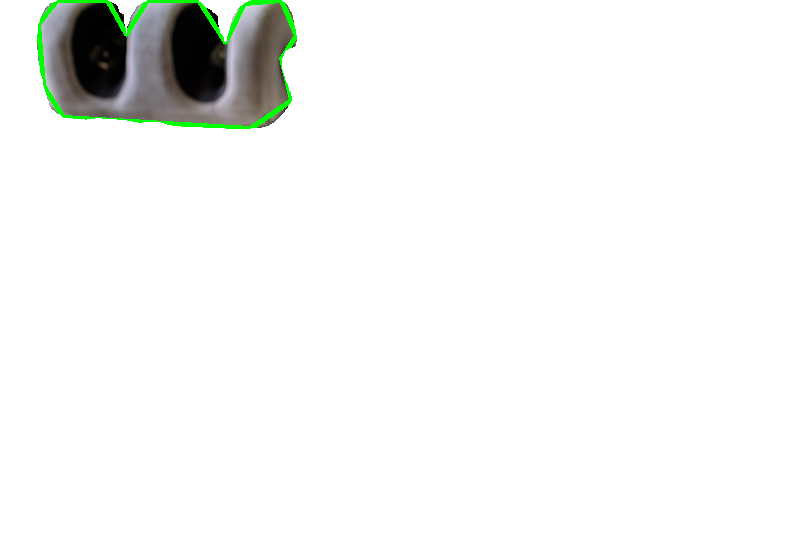

You selected: Person


In [150]:
# Get the height and width of the image
h, w = image.shape[:2]
masks = filter_mask(masks, h, w)

data = []

for i in range(len(masks)):
    data.append([])
    current_mask = masks[i]['segmentation']
    current_mask_img = image * current_mask[:,:,np.newaxis] + (1 - current_mask[:,:,np.newaxis]) * 255
    current_mask_img = np.uint8(current_mask_img)

    current_mask_img = Image.fromarray(current_mask_img)

    segment_coords = extract_segment(current_mask)
    flat_segment_coords = numpy_to_list(segment_coords)

    for j in range(len(flat_segment_coords)):
        if i%2 == 0:
            flat_segment_coords[j] = flat_segment_coords[j]/w
        else:
            flat_segment_coords[j] = flat_segment_coords[j]/h


    display(current_mask_img.resize((w,h)))
    label = prompt_user()
    flat_segment_coords.insert(0, label)
    data[i].append(flat_segment_coords)
    data[i].append(segment_coords)


In [151]:
print(data)

[[[1, 0.505, 0.35875, 0.415, 0.29, 0.2675, 0.28, 0.24, 0.32, 0.26625, 0.34625, 0.165, 0.39875, 0.0, 0.5525, 0.0, 0.665, 0.32375, 0.66375, 0.355, 0.515, 0.49125, 0.44875, 0.5275, 0.40875], [array([[[404, 287]],

       [[332, 232]],

       [[214, 224]],

       [[192, 256]],

       [[213, 277]],

       [[132, 319]],

       [[  0, 442]],

       [[  0, 532]],

       [[259, 531]],

       [[284, 412]],

       [[393, 359]],

       [[422, 327]]], dtype=int32)]], [[2, 1.2602996254681649, 0.3352059925093633, 1.1947565543071161, 0.4606741573033708, 1.1629213483146068, 0.5880149812734082, 1.1666666666666667, 0.6273408239700374, 1.2228464419475655, 0.5205992509363296, 0.20786516853932585, 0.2303370786516854, 0.14232209737827714, 0.2546816479400749, 0.08052434456928839, 0.20037453183520598, 0.0, 0.22284644194756553, 0.0, 0.30337078651685395, 0.08052434456928839, 0.31835205992509363, 0.0, 0.37640449438202245, 0.0, 0.8183520599250936, 0.2546816479400749, 0.5842696629213483, 0.393258426966292

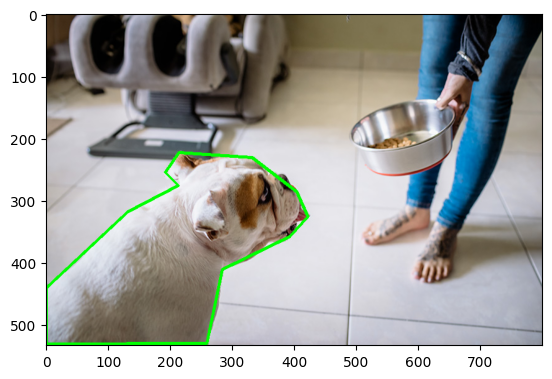

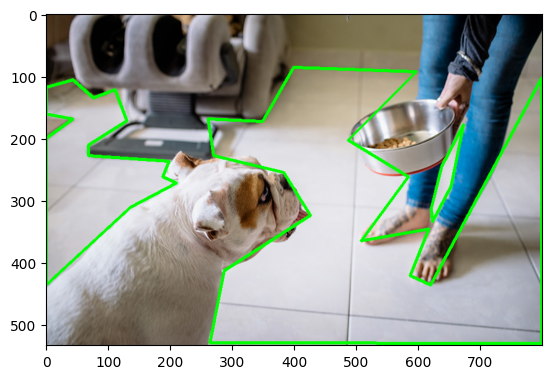

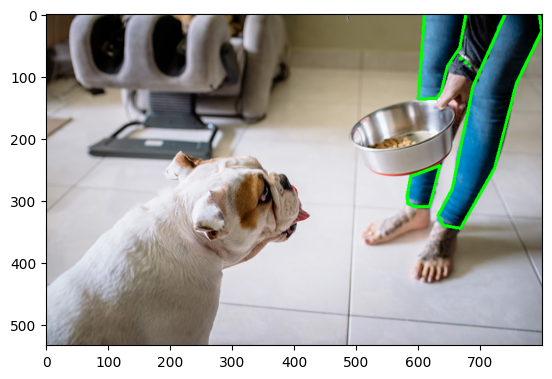

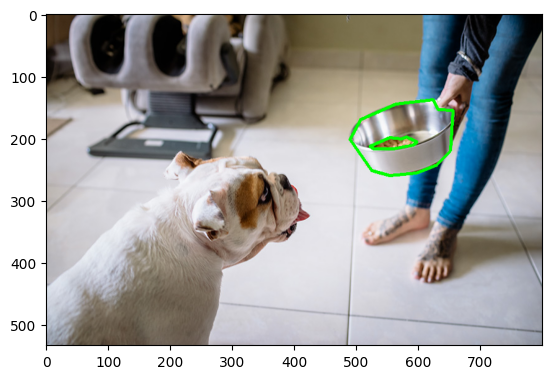

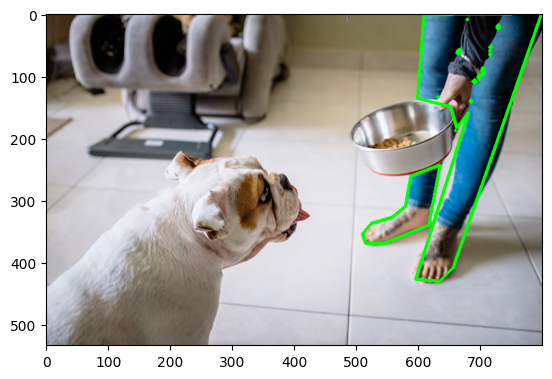

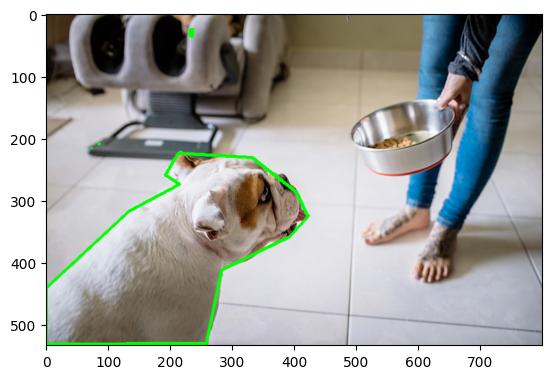

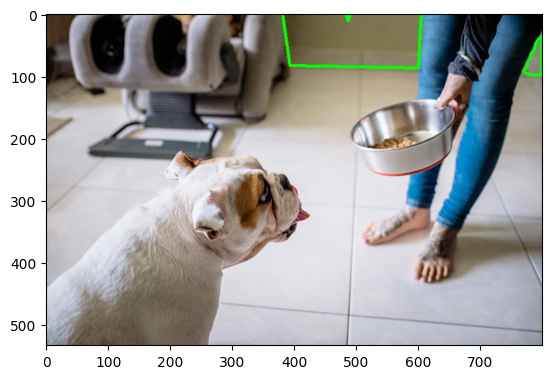

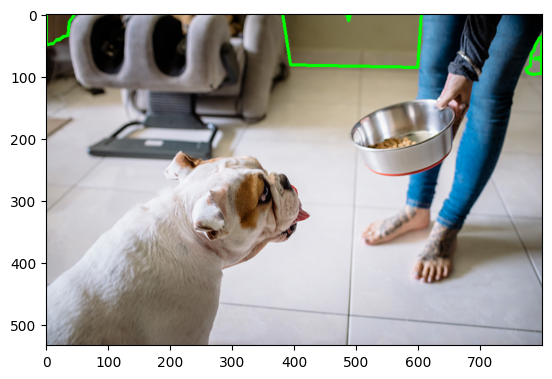

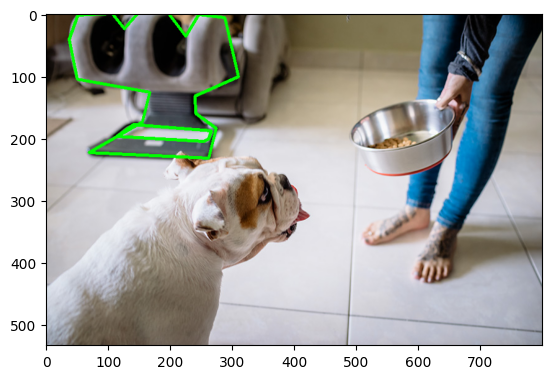

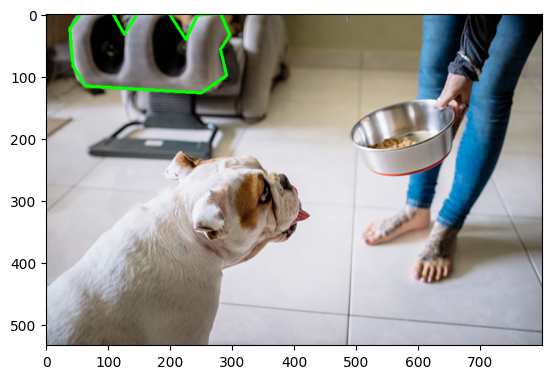

In [143]:
for i in data:
    image = cv2.imread('images/dog.jpg') # Read image from file
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Convert from BGR to RGB
    draw_segment(image, i[1])

In [141]:
def view_segments(data, image_path):
    j = 0
    for i in data:
        image = cv2.imread(image_path) # Read image from file
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Convert from BGR to RGB
        draw_segment(image, i[1])
        print("Segment Index: " + str(j))
        print("Class " + str(i[0][0]) + ": " + labels[i[0][0]])
        j += 1
    

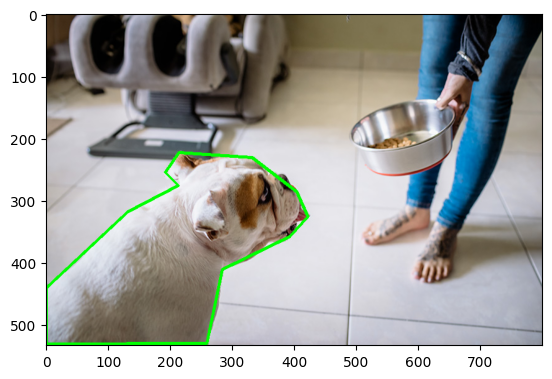

Segment Index: 0
Class 1: Wall


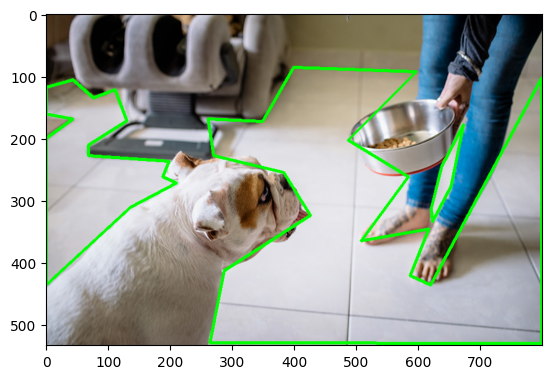

Segment Index: 1
Class 2: Floor


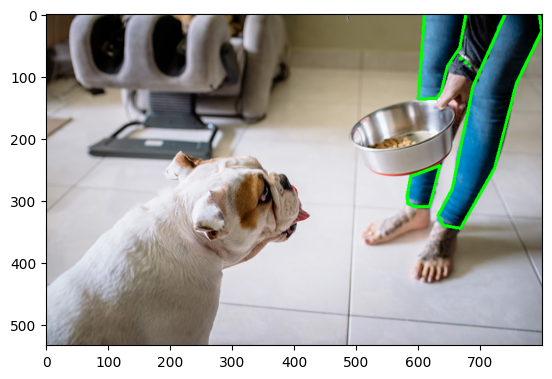

Segment Index: 2
Class 3: Ceiling


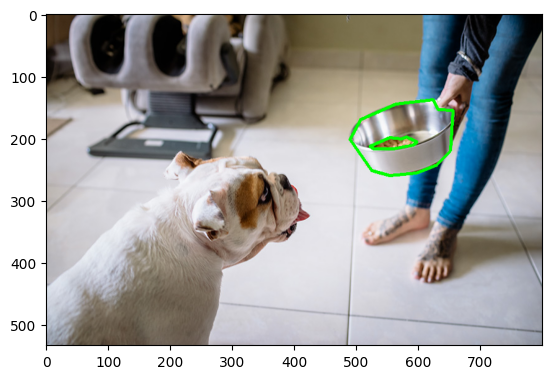

Segment Index: 3
Class 4: Door


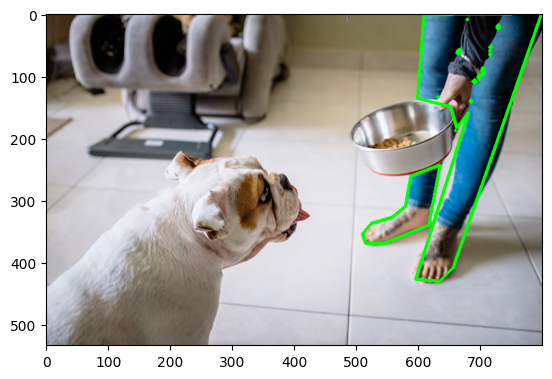

Segment Index: 4
Class 5: Door frame


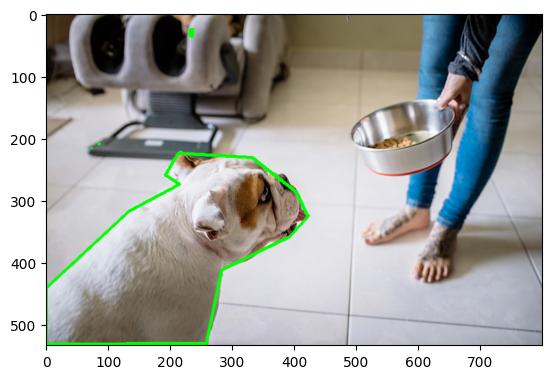

Segment Index: 5
Class 6: Gate


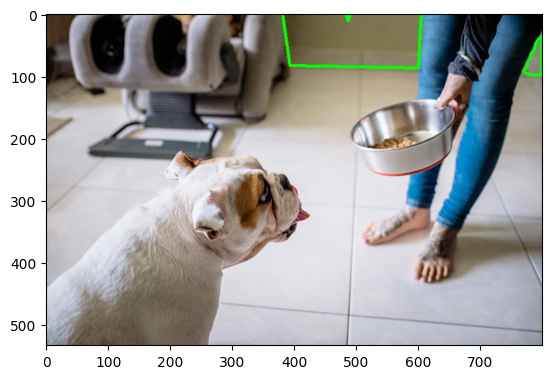

Segment Index: 6
Class 7: Building materials


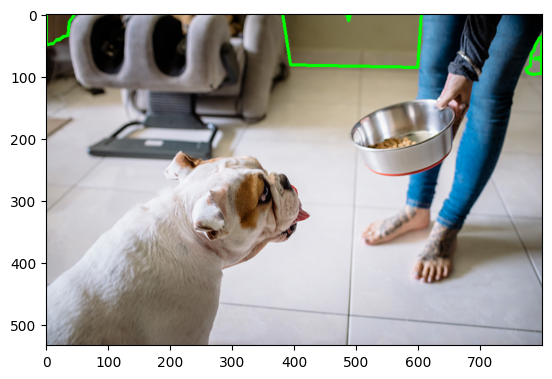

Segment Index: 7
Class 8: Tools


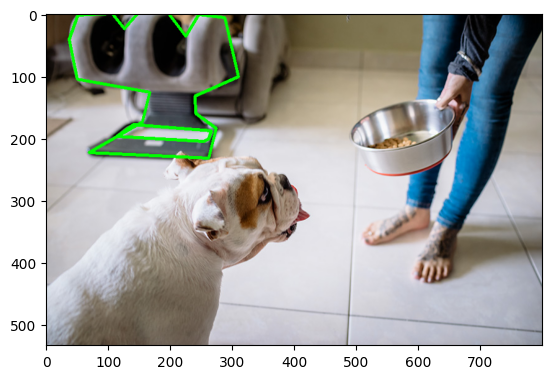

Segment Index: 8
Class 9: Windows


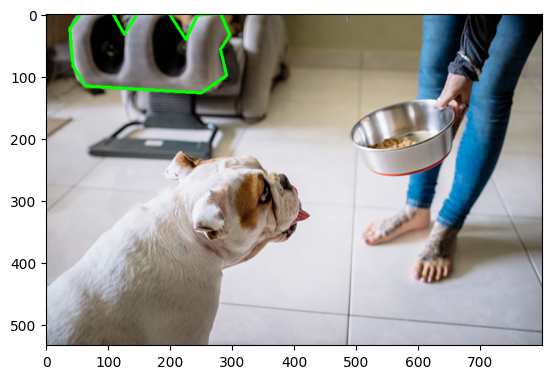

Segment Index: 9
Class 10: Person


In [142]:
view_segments(data, 'images/dog.jpg')

In [ ]:
def merge_classes(data):
    legend = ""
    for key, val in labels.items():
        legend += str(key) + ": " + val +'\n'
    legend += "-1: done"

    classes = []
    while True:
        try:
            user_input = int(input(legend + "Class" + str(i) + " to merge: "))
            if 0 <= user_input < len(legend):
                print(f"You selected: {labels[user_input]}")
                classes.append(user_input)
            elif user_input == -1:
                break
            else:
                print("The number is not within the range. Please try again.")
    
        except ValueError:
            print("That's not a valid number. Please try again.")

    user_input = str(input("Type class name for merged classes: "))

    j = 0
    new_labels = {}
    for key, val in labels.items():
        if key not in classes:
            new_labels[j] = val
            j += 1
    new_labels[j] = user_input

    for i in data:
        if i[0][0] in classes
            i[0][0] = j


# For use

Functions

In [201]:
def load_images(path):
    images = []
    for filename in os.listdir(path):
        if filename.endswith(".jpg") or filename.endswith(".png"): 
            # complete filename
            img_path = os.path.join(path, filename)
            
            # Read the image
            image = cv2.imread(img_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Convert from BGR to RGB

            images.append([image, filename])
    
    return images


def prompt_user():
    legend = ""
    for key, val in labels.items():
        legend += str(key) + ": " + val +'\n'
    while True:
        try:
            user_input = int(input(legend + "Please enter a number: "))
            if 0 <= user_input < len(labels):
                print(f"You selected: {labels[user_input]}")
                break
            else:
                print("The number is not within the range. Please try again.")
        except ValueError:
            print("That's not a valid number. Please try again.")
    return user_input


# extract the coordinates of the segment from SAM into a list of numpy array
def extract_segment(mask):
    binary_mask = np.array(mask) # get the segmentation of the mask and convert it to a numpy array
    binary_mask = (binary_mask * 255).astype(np.uint8) # convert the mask to a binary mask

    contours, hierarchy = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE) # find contours from the binary image
    polygon_coords = [] # stores the coordinates of the vertices of the polygon
    
    for contour in contours:
        epsilon = 0.01 * cv2.arcLength(contour, True) # approximate contour with accuracy proportional to the contour perimeter
        approx = cv2.approxPolyDP(contour, epsilon, True) # approximate contour with the Douglas-Peucker algorithm

        polygon_coords.append(approx) # add the coordinates of the vertices of the polygon to the list
    return polygon_coords


# define a function to filter the mask based on the area
def filter_mask(mask, h, w):
    # specify the minimum area of the mask
    min_area = 0.03 * h * w
    # create a new dictionary
    new_dict = []

    # filter the masks based on the area
    for i in mask:
        if i['area'] > min_area:
            new_dict.append(i)
    
    return new_dict

# display the segment on the image
def draw_segment(img, coord):
    cv2.drawContours(img, coord, -1, (0, 255, 0), 3) # draw the contours on the image
    plt.imshow(img, cmap='gray') # show the image
    plt.show()


def numpy_to_list(numpy_arr):
    # Convert each numpy array in the list to a regular list and extract the inner lists
    coord_list = [coord[0].tolist() for array in numpy_arr for coord in array]
    flat_list = []
    for coord in coord_list:
        flat_list.append(coord[0])
        flat_list.append(coord[1])
    return flat_list


def get_yolo_data(image, masks, h, w):
    masks = filter_mask(masks, h, w)

    data = []
    k = 0

    for i in range(len(masks)):
        
        current_mask = masks[i]['segmentation']
        current_mask_img = image * current_mask[:,:,np.newaxis] + (1 - current_mask[:,:,np.newaxis]) * 255
        current_mask_img = np.uint8(current_mask_img)

        current_mask_img = Image.fromarray(current_mask_img)

        segment_coords = extract_segment(current_mask)
        flat_segment_coords = numpy_to_list(segment_coords)

        for j in range(len(flat_segment_coords)):
            if j%2 == 0:
                flat_segment_coords[j] = flat_segment_coords[j]/w
            else:
                flat_segment_coords[j] = flat_segment_coords[j]/h


        display(current_mask_img.resize((w,h)))
        label = prompt_user()
        if (labels[label] != "NA"):
            data.append([])
            flat_segment_coords.insert(0, label)
            data[k].append(flat_segment_coords)
            data[k].append(segment_coords)
            k += 1

    return data

Input relevant details

In [199]:
labels = {
    0: "Pipe",
    1: "Wall",
    2: "Floor",
    3: "Ceiling",
    4: "Door",
    5: "Door frame",
    6: "Gate",
    7: "Building materials",
    8: "Tools",
    9: "Windows",
    10: "Person",
    11: "Safety rails",
    12: "Electrical cable",
    13: "Lens effect",
    14: "NA"
}

labels = {
    0: "dog",
    1: "floor",
    2: "wall",
    3: "NA"
}
img_path = "images/"


images = load_images(img_path)
masks_list = []

for image in images:
    h, w = image[0].shape[:2]
    masks_list.append([image[0], mask_generator.generate(image[0]),h,w,image[1]]) # Generate masks
    # [ [corresponding image, mask, h, w, filename], ... ]

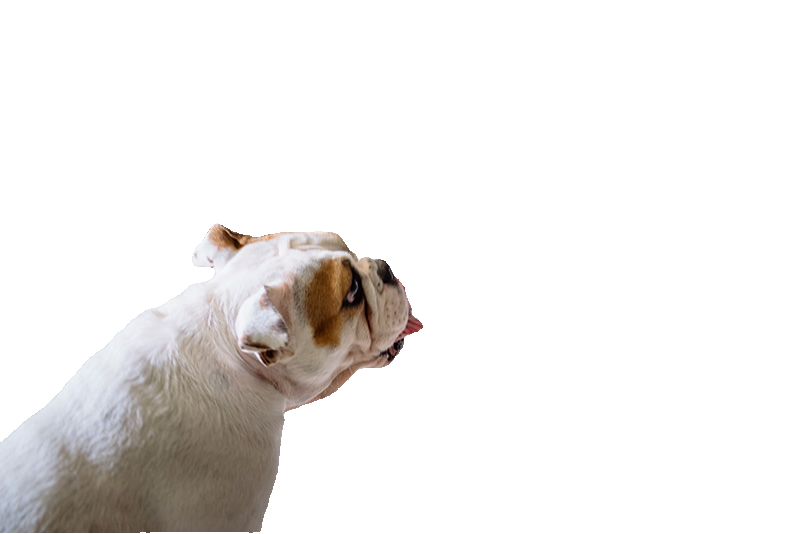

You selected: dog


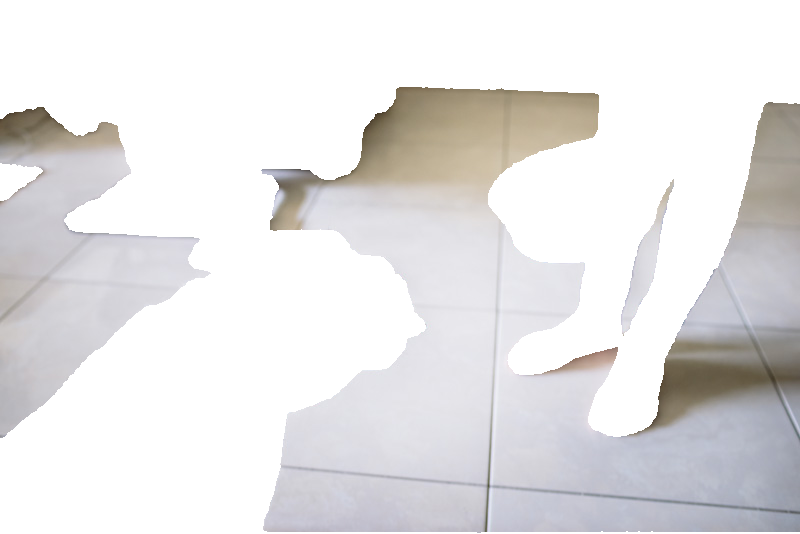

You selected: floor


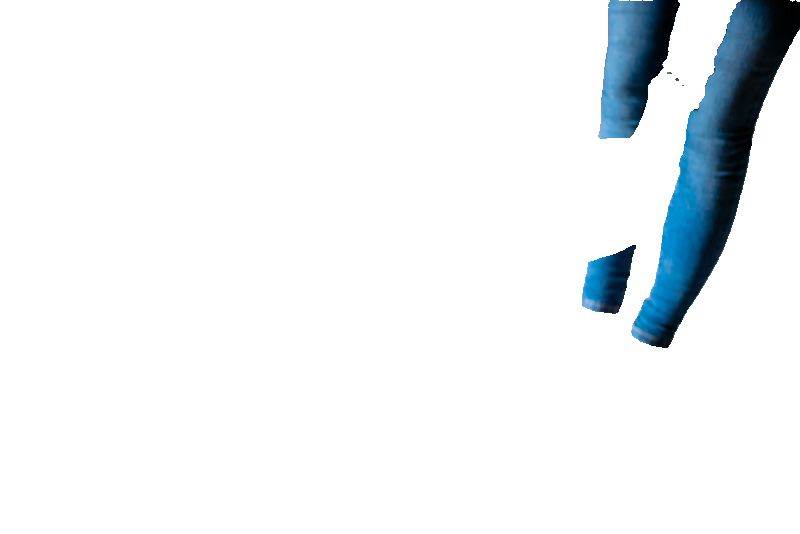

You selected: NA


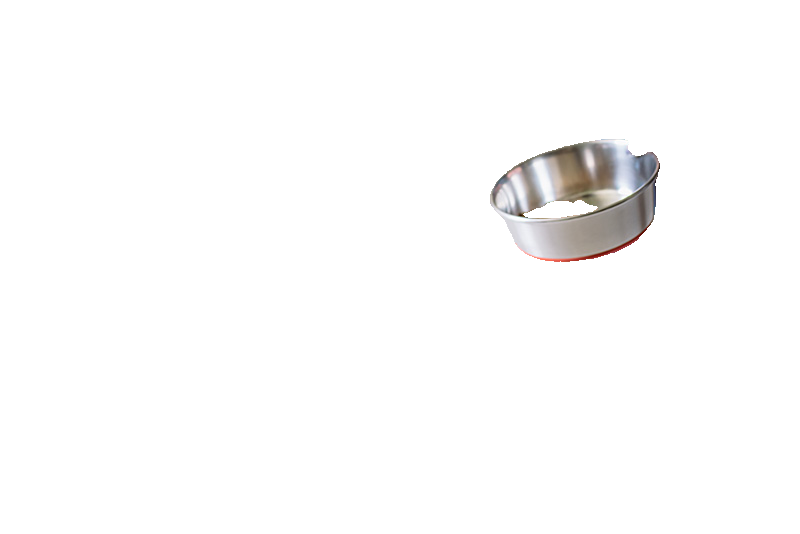

You selected: NA


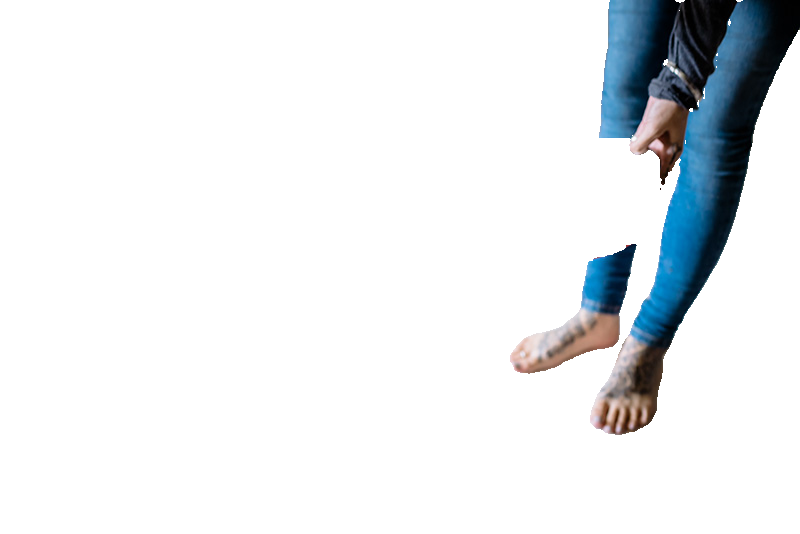

You selected: NA


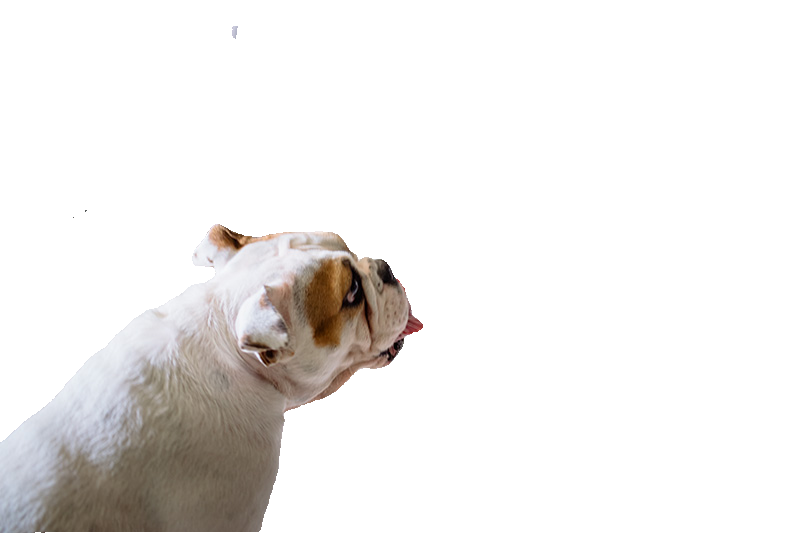

You selected: dog


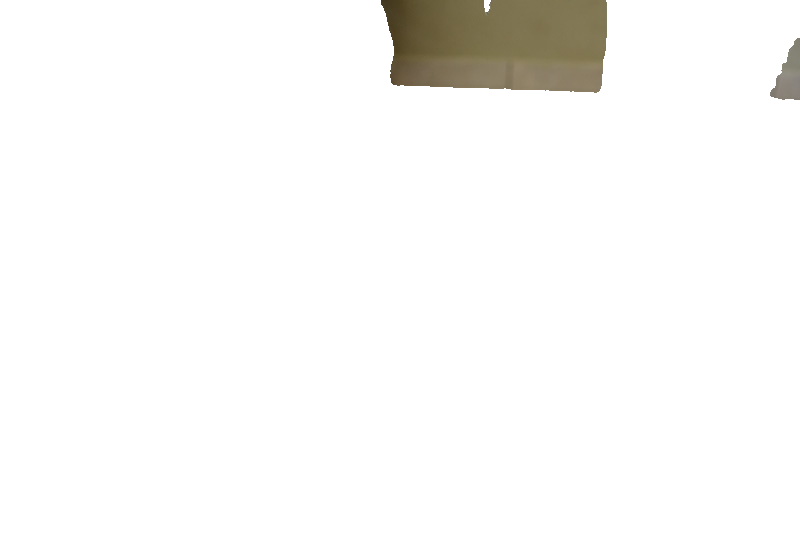

You selected: wall


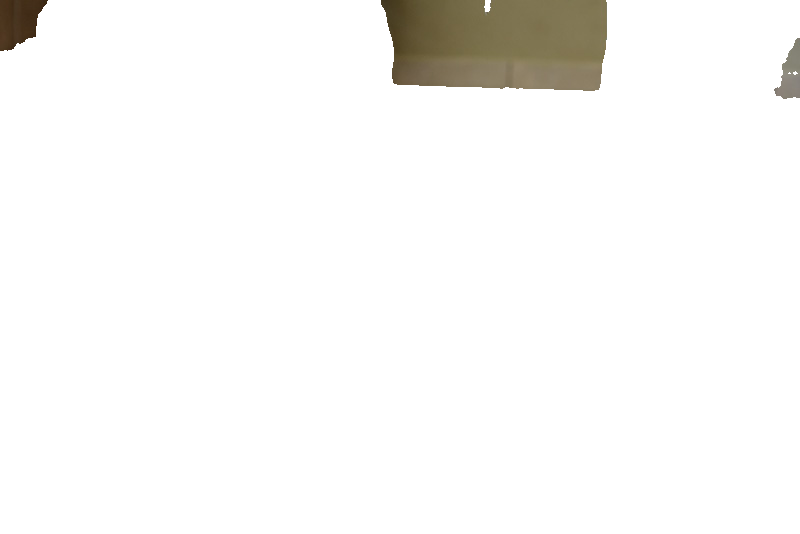

You selected: wall


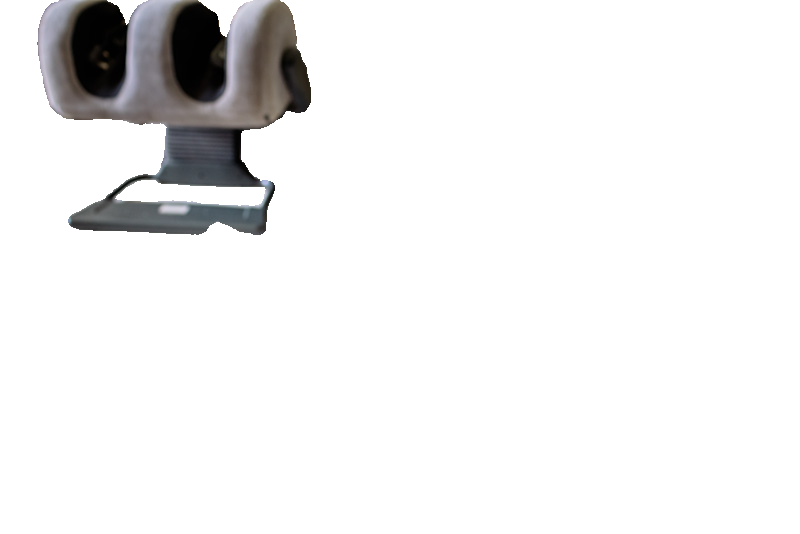

You selected: NA


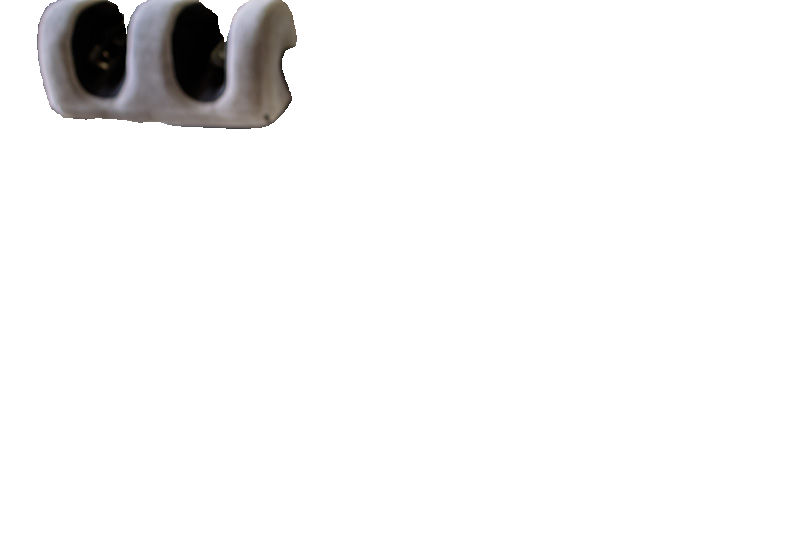

You selected: NA


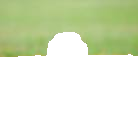

You selected: NA


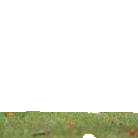

You selected: floor


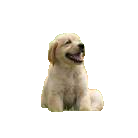

You selected: dog


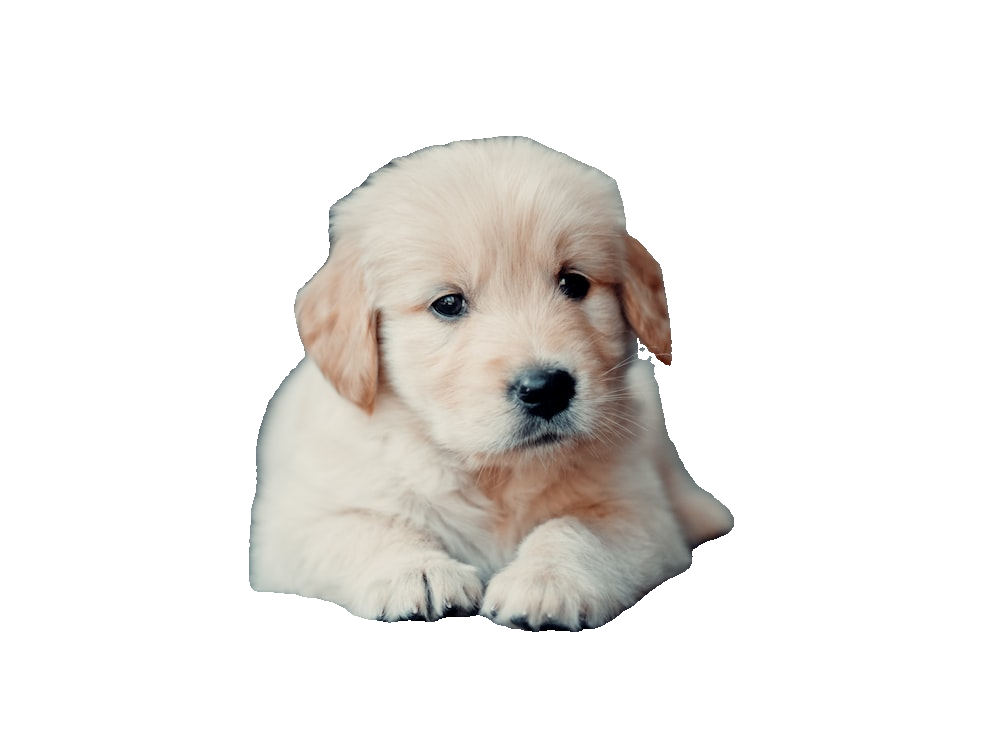

You selected: dog


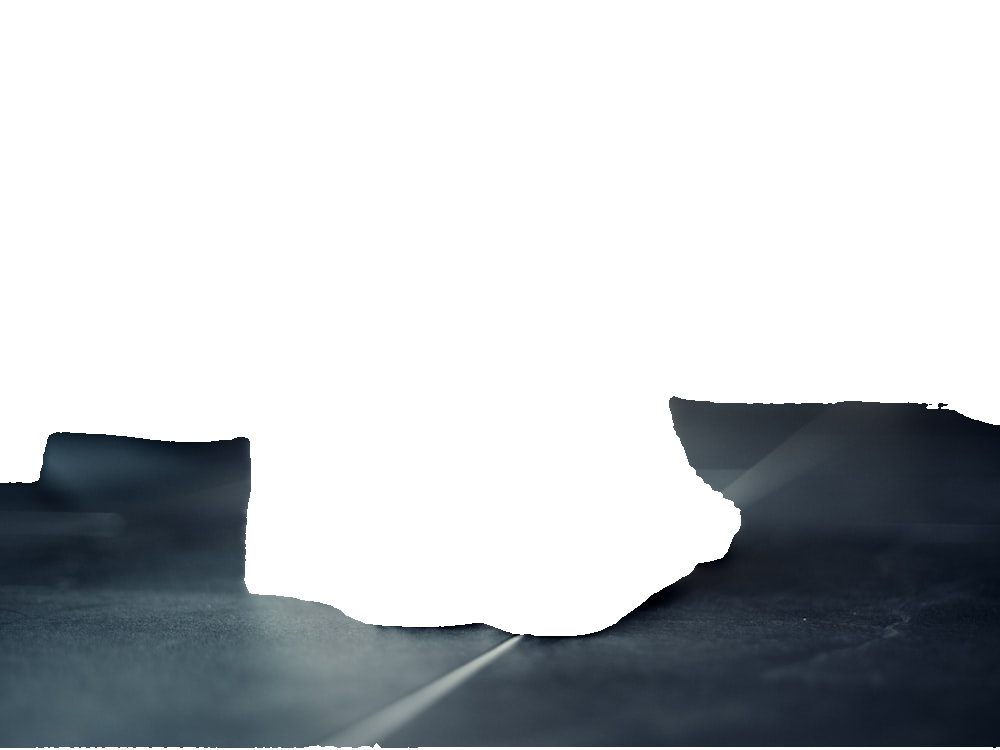

You selected: floor


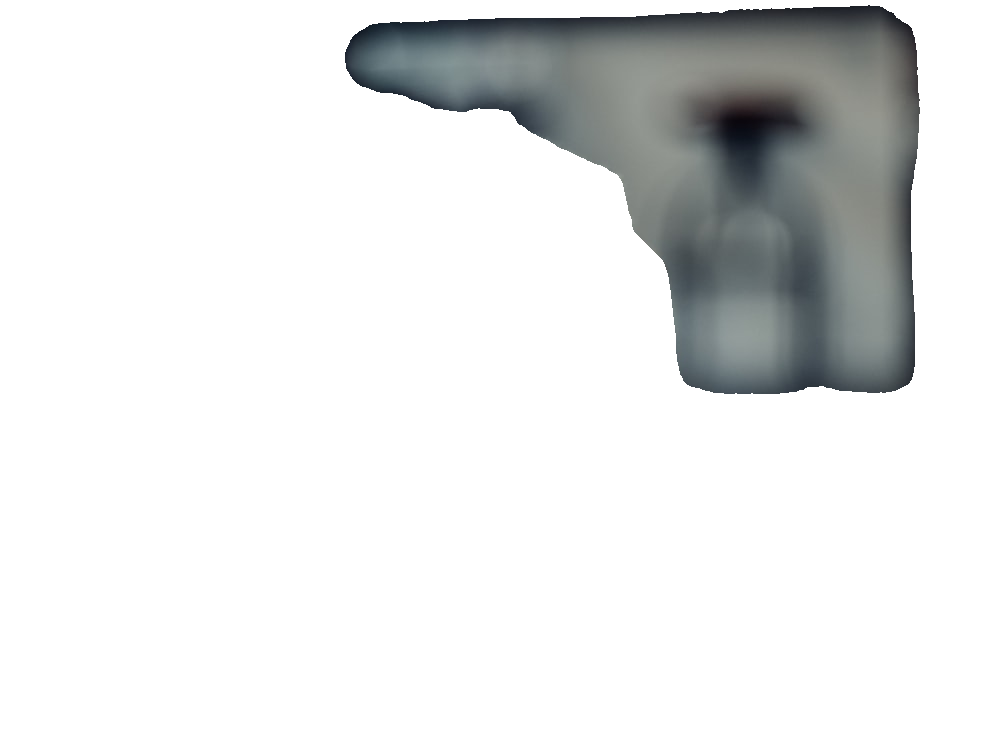

You selected: NA


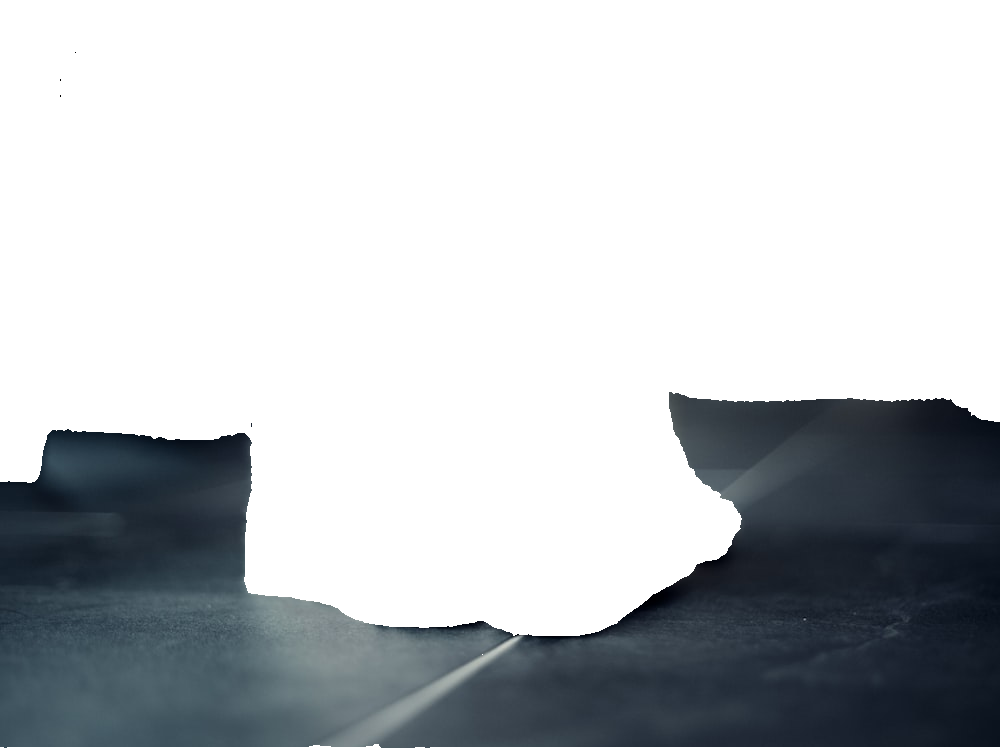

You selected: floor


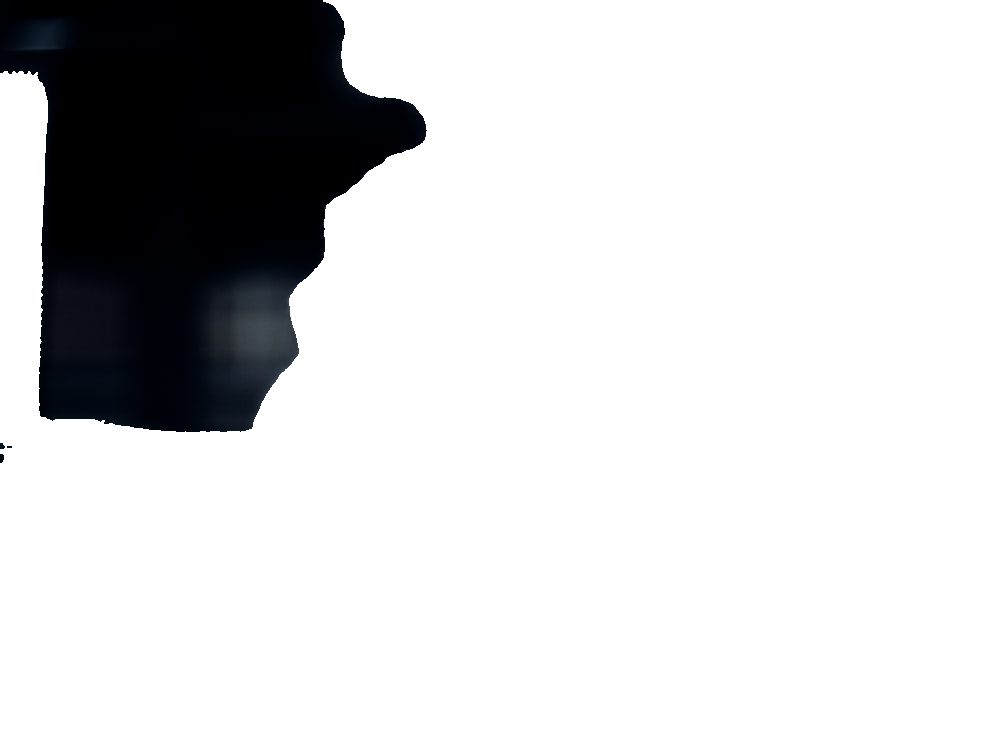

You selected: NA


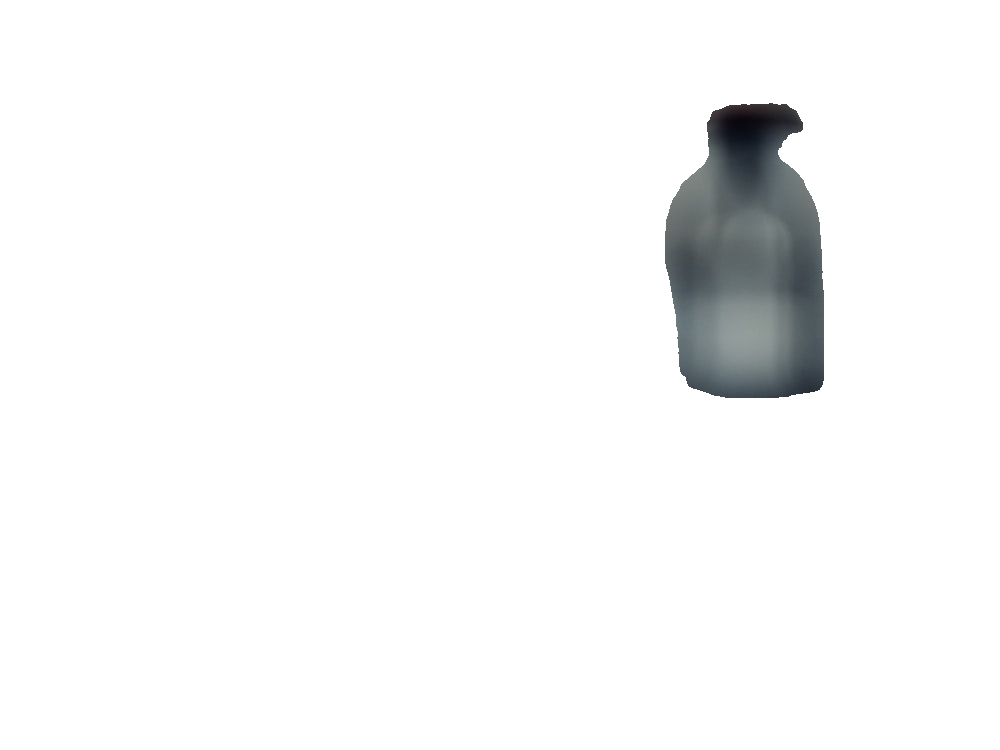

You selected: NA


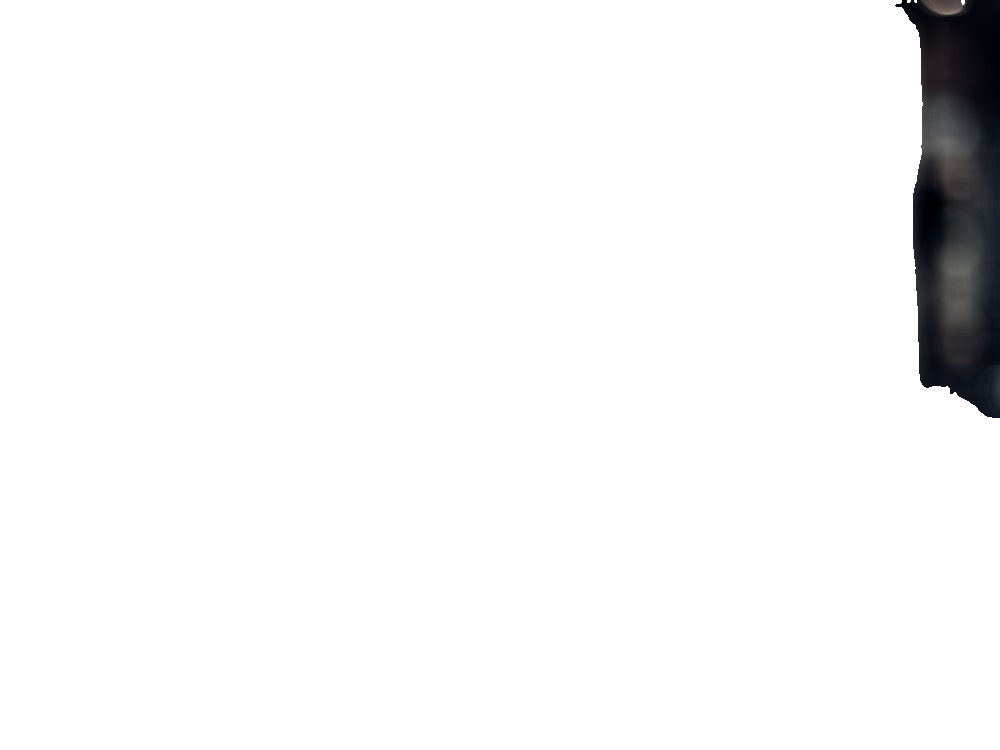

You selected: NA


In [202]:
data = []

for mask in masks_list:
    data.append( [get_yolo_data(mask[0], mask[1], mask[2], mask[3]), mask[4]] )
    # data = [
    #          [
    #            [class, coords, numpy_coords]
    #            ...
    #            [class, coords, numpy_coords], 
    #            filename
    #          ],  
    #          ...
    #        ]

In [237]:
len(data[0][0])

5

In [247]:
for line in data[0][0]:
    print(line[0][0])
    print("")


0

1

0

2

2



In [248]:
def output_to_txt(data):
    fname = data[-1][0:-4] # get the filename from the last element of the data
    with open(fname + '.txt', 'w') as f:
        for line in data[0]:
            class_num = line[0][0]
            coords = line[0][1:]
            f.write(f"{class_num} {' '.join(map(str, coords))}\n")


output_to_txt(data[0])
